### Simple model without horizon and location
$y_t \mid \varepsilon_t = \theta + \sum_{p=1} \phi_p y_{t-p} + \varepsilon_t, \\
\varepsilon_t \sim N(0, \sigma_{\eta}) $


In [1]:
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
os.environ['MPLBACKEND'] = 'TKAgg'

import numpy as np
import pandas as pd
import matplotlib
# matplotlib.use('TkAgg')
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import date

import jax
import jax.numpy as jnp

import arviz as az


In [2]:
from arhdfa_l1h1_me import ARHDFA

In [ ]:
os.getcwd()

In [3]:
def loaddata(model1, model2, val, mean_axis):
    mypath = f'/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/Data/death_diff_scores/{model1}_{model2}.csv'
    df = pd.read_csv(mypath)
    lix = pd.MultiIndex.from_product([np.unique(df.location), np.unique(df.relative_horizon)])
    df_pivot = (df.pivot_table(val, 'reference_date', ['location', 'relative_horizon'], aggfunc='first')).reindex(lix, axis=1)
    mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
    if model1 == 'COVIDhub-baseline' or model2 == 'COVIDhub-baseline':
        indices_to_change = [(38, 13), (21, 24), (24, 41)]
        for index in indices_to_change:
            mydf = mydf.at[index[0], index[1], :].set(np.nan) 
        print(mydf[38,13,:])
    if mean_axis == 'location':
        mydf_mean = np.mean(mydf, axis=1)
        mydf_reshape = mydf_mean.reshape(mydf_mean.shape[0],1,mydf_mean.shape[1])
    elif mean_axis == 'horizon':
        mydf_mean = np.mean(mydf, axis=2)
        mydf_reshape = mydf_mean.reshape(mydf_mean.shape[0],mydf_mean.shape[1],1)
    elif mean_axis == 'both':
        mydf_mean = np.mean(mydf, axis=(1,2))
        mydf_reshape = mydf_mean.reshape(mydf_mean.shape[0],1,1)
    else:  mydf_reshape = mydf[:,0,0].reshape(mydf.shape[0],1,1)
    return mydf_reshape

In [4]:
def dfa_ftn(model1, model2, val, mean_axis, p=1, q=1, sigma_time = 'constant', ar_constraint='[0,1]'):
    obs = loaddata(model1, model2, val, mean_axis)
    # Define a DFA model with specified parameter values to use for data generation
    dfa_model = ARHDFA(num_timesteps=obs.shape[0], num_series=obs.shape[1], num_horizons=obs.shape[2], 
                        p=p, q=q, ar_constraint=ar_constraint, sigma_time=sigma_time,
                        ar_var_constraint='[0,1]')
    mcmc_samples = dfa_model.fit(y=obs,
                             rng_key=jax.random.PRNGKey(79942),
                             num_warmup=5000,
                             num_samples=5000,
                             thinning = 1,
                             num_chains=3)
    dfa_model.mcmc.print_summary()
    waic = az.waic(az.from_numpyro(mcmc_samples))
    print(waic)
    az.plot_pair(az.from_numpyro(mcmc_samples), 
             divergences=True,
             colorbar=True)
    az.plot_trace(az.from_numpyro(mcmc_samples))




/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:01<00:00, 5993.93it/s, 3 steps of size 4.78e-01. acc. prob=0.86]



MCMC elapsed time: 9.346972942352295

                          mean       std    median      5.0%     95.0%     n_eff     r_hat
       ARVar_mu[0,0]      0.70      1.06      0.70     -1.09      2.40  15680.40      1.00
          alpha[0,0]      0.71      0.27      0.81      0.26      1.00  12626.18      1.00
        intercept[0]    -19.09      0.27    -19.09    -19.55    -18.66  16449.82      1.00
log_sigma_eta_0[0,0]      1.01      0.99      1.01     -0.64      2.58  17728.35      1.00
log_sigma_eta_t[0,0]      4.82      0.03      4.82      4.77      4.88  16556.67      1.00
            phi[0,0]      0.07      0.05      0.06      0.00      0.15  16731.86      1.00
         sigma_nu[0]      1.55      0.62      1.51      0.52      2.51  11515.56      1.00
            y_0[0,0]     -0.05      1.01     -0.05     -1.72      1.58  16750.97      1.00

Number of divergences: 4
Computed from 15000 posterior samples and 1764 observations log-likelihood matrix.

          Estimate       SE
elpd

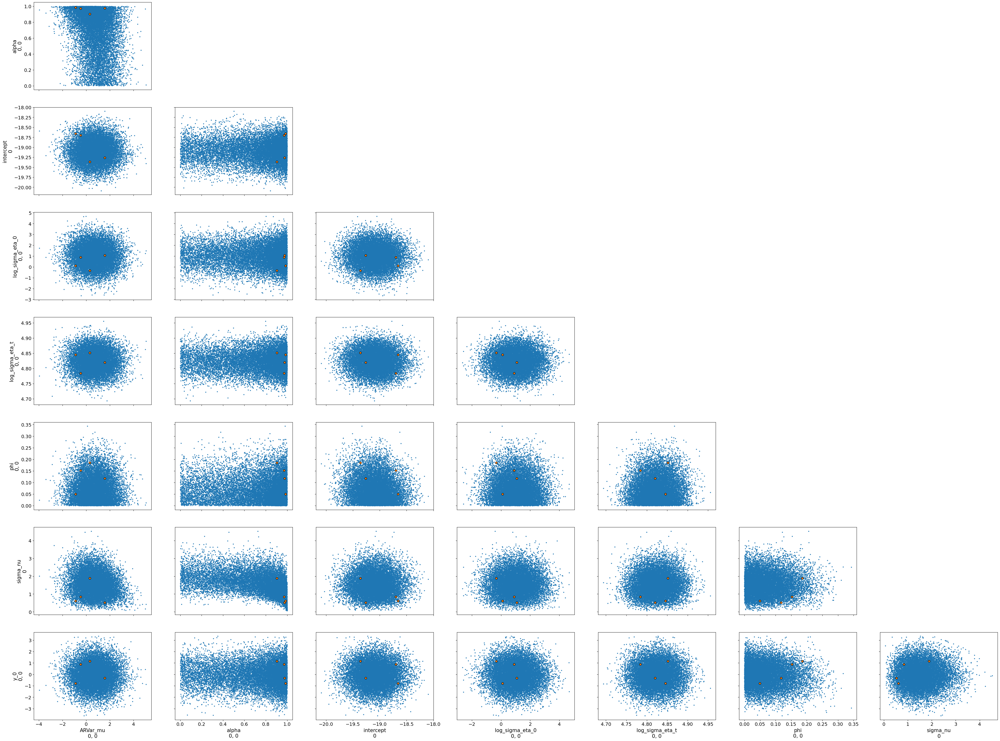

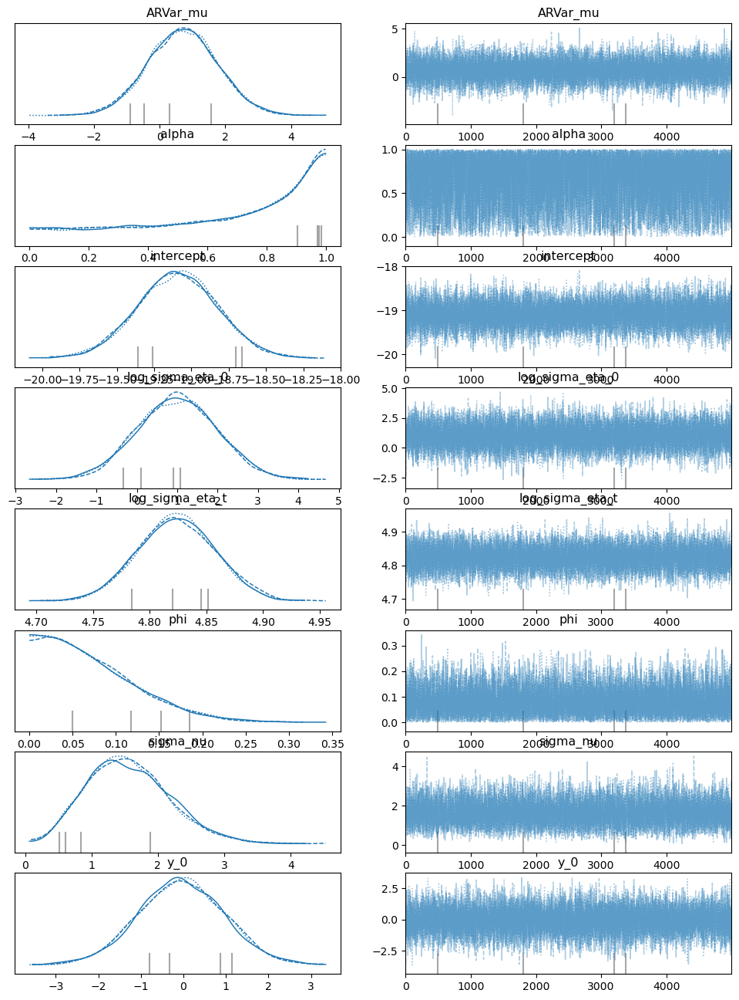

In [5]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=1, q=1, sigma_time = 'constant')

/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:01<00:00, 5310.50it/s, 7 steps of size 3.47e-01. acc. prob=0.93]



MCMC elapsed time: 63.12369203567505

                          mean       std    median      5.0%     95.0%     n_eff     r_hat
       ARVar_mu[0,0]      0.67      1.04      0.68     -1.02      2.31    933.73      1.00
          alpha[0,0]      0.72      0.27      0.82      0.28      1.00   3201.23      1.01
        intercept[0]    944.39   4814.92    -18.95    -20.12   1015.24     49.31      1.08
log_sigma_eta_0[0,0]      1.00      0.99      1.00     -0.60      2.65   2050.87      1.00
log_sigma_eta_t[0,0]      4.84      0.04      4.84      4.78      4.90      6.02      1.14
            phi[0,0]      0.37      0.44      0.08      0.01      1.00      1.51     12.75
            phi[0,1]      0.03      0.03      0.01      0.00      0.08      4.03      1.23
         sigma_nu[0]      1.55      0.62      1.50      0.52      2.50   2393.64      1.00
            y_0[0,0]     -4.96      6.98     -0.73    -15.41      1.13      1.52      8.85
            y_0[1,0]     -0.01      0.96      0.01 

/Users/dk29776/miniconda3/envs/forecastskill/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


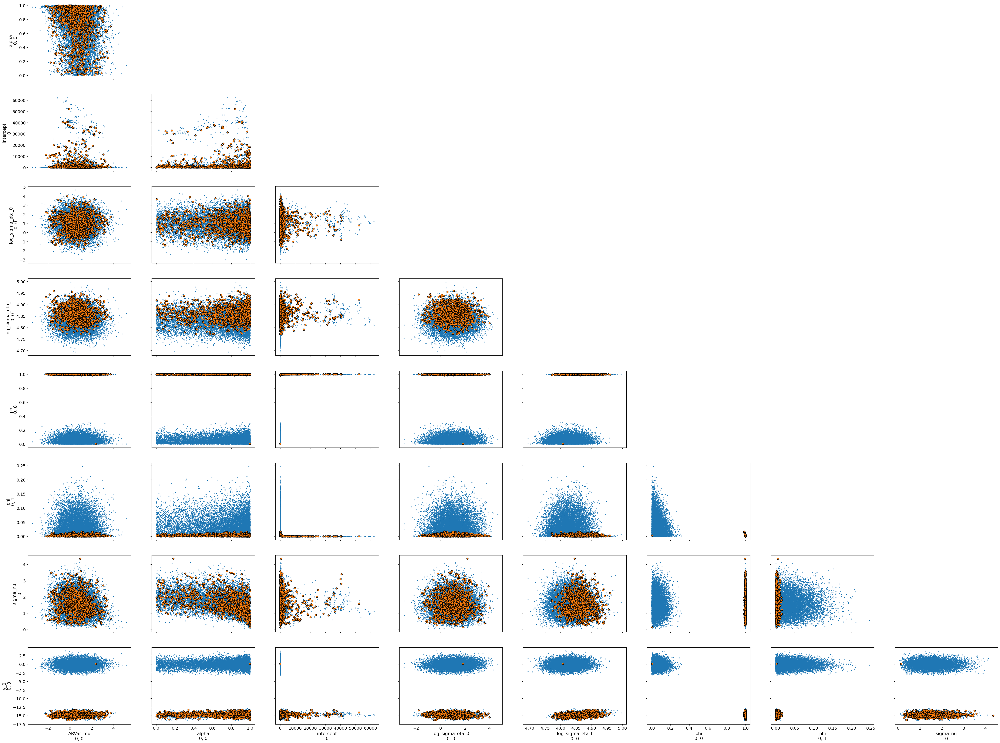

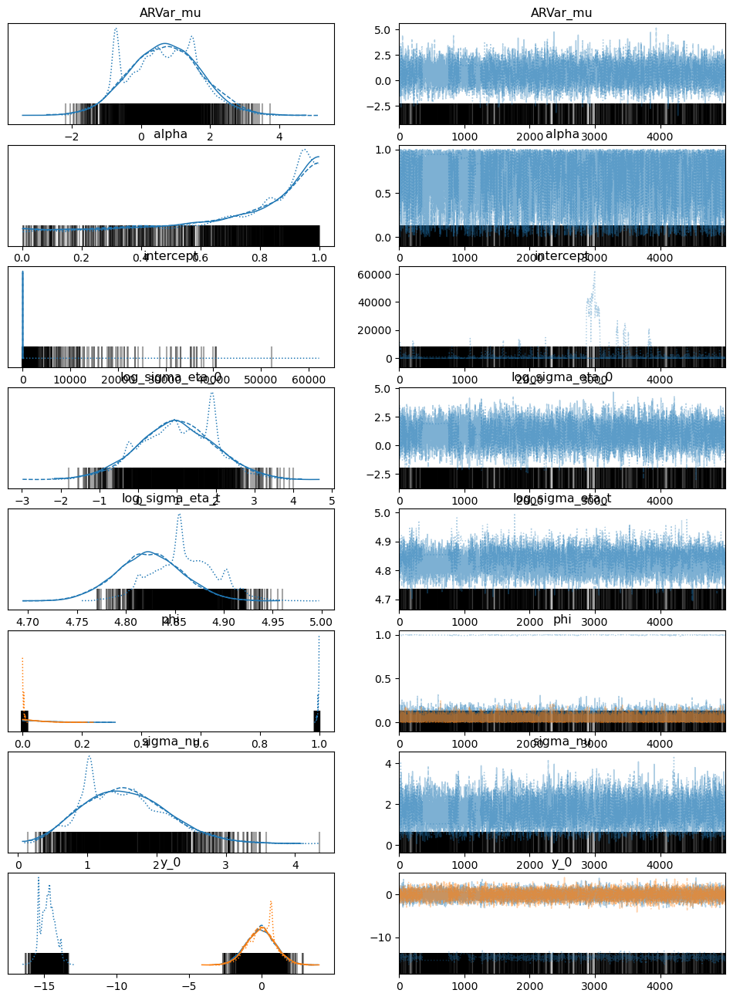

In [6]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=2, q=1, sigma_time = 'constant')

/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:01<00:00, 5688.15it/s, 7 steps of size 4.14e-01. acc. prob=0.91]



MCMC elapsed time: 7.27344822883606

                          mean       std    median      5.0%     95.0%     n_eff     r_hat
       ARVar_mu[0,0]      0.71      1.03      0.71     -0.98      2.43  15450.86      1.00
          alpha[0,0]      0.71      0.28      0.81      0.23      1.00  12529.44      1.00
        intercept[0]    -19.06      0.27    -19.06    -19.51    -18.61  16012.69      1.00
log_sigma_eta_0[0,0]      1.00      1.01      1.00     -0.66      2.67  17360.07      1.00
log_sigma_eta_t[0,0]      4.82      0.03      4.82      4.77      4.88  18359.74      1.00
            phi[0,0]      0.02      0.13      0.01     -0.19      0.23   9598.47      1.00
            phi[0,1]     -0.01      0.09     -0.01     -0.16      0.14  10086.22      1.00
         sigma_nu[0]      1.56      0.62      1.51      0.55      2.53  12567.02      1.00
            y_0[0,0]     -0.09      1.00     -0.09     -1.72      1.56  16123.86      1.00
            y_0[1,0]      0.02      0.98      0.02  

/Users/dk29776/miniconda3/envs/forecastskill/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


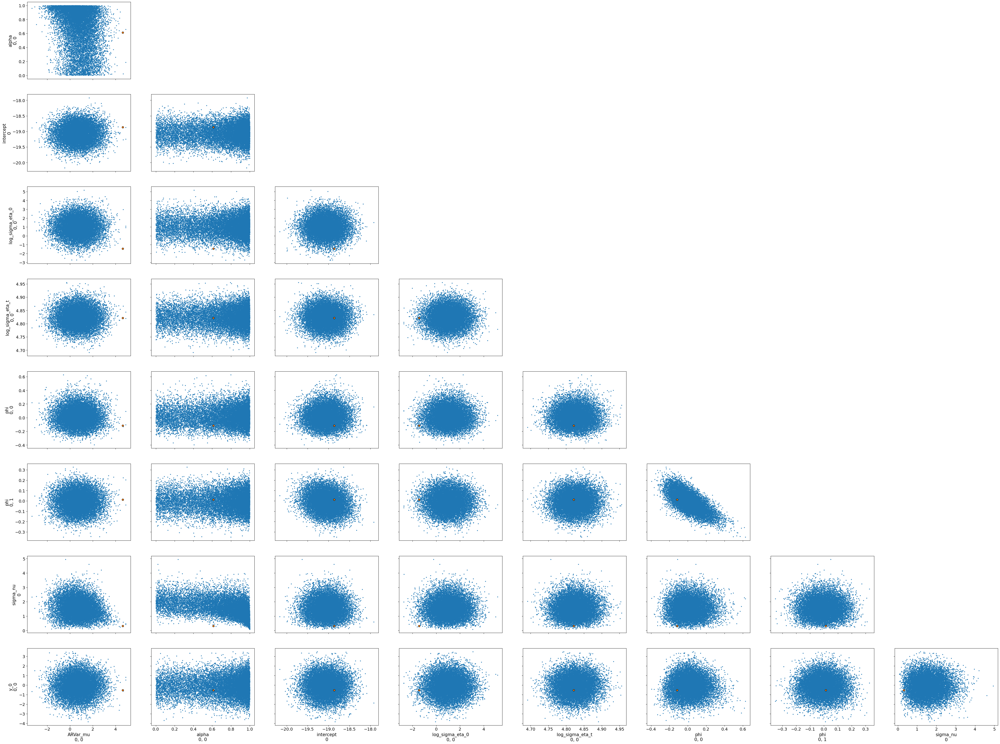

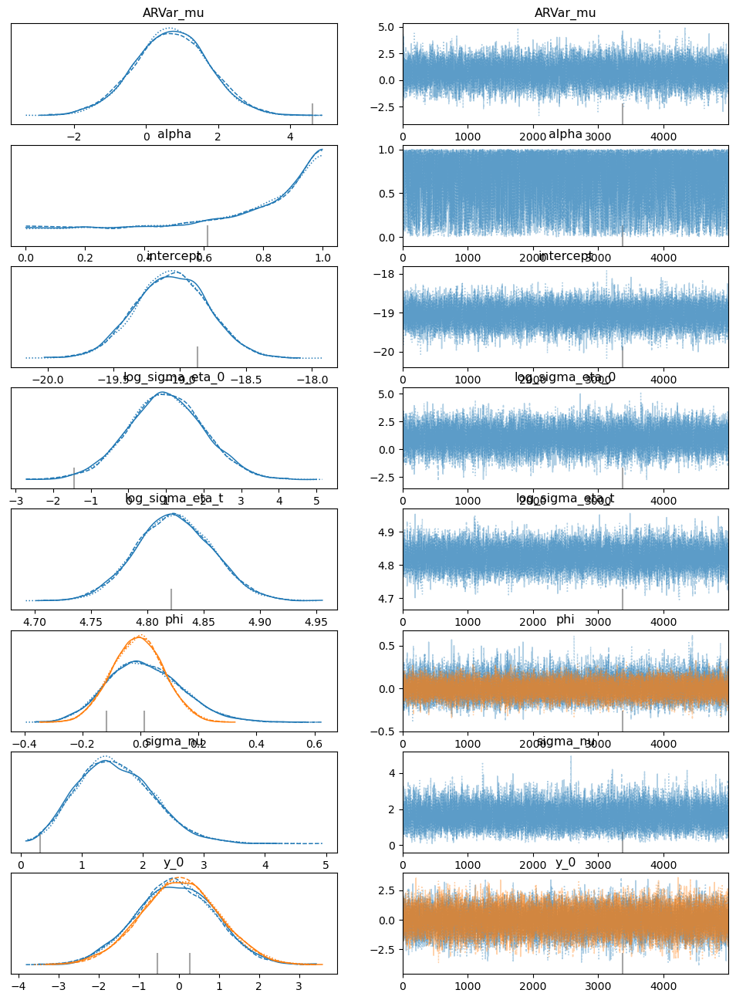

In [7]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=2, q=1, sigma_time = 'constant', ar_constraint = '[-1,1]')

/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:03<00:00, 3017.55it/s, 15 steps of size 1.80e-01. acc. prob=0.82]



MCMC elapsed time: 13.463866233825684

                           mean       std    median      5.0%     95.0%     n_eff     r_hat
        ARVar_mu[0,0]      0.48      1.05      0.46     -1.26      2.20   2801.37      1.00
           alpha[0,0]      0.60      0.29      0.65      0.15      1.00   1097.99      1.00
         intercept[0]    -19.10      0.27    -19.09    -19.55    -18.66  11600.95      1.00
 log_sigma_eta[0,0,0]      4.82      0.03      4.82      4.77      4.88  12576.76      1.00
 log_sigma_eta[1,0,0]      3.17      2.29      3.26     -0.49      6.95   2868.88      1.00
 log_sigma_eta[2,0,0]      2.52      2.73      2.52     -2.11      6.75   2899.43      1.00
 log_sigma_eta[3,0,0]      2.13      2.93      2.08     -2.29      7.22   3338.85      1.00
 log_sigma_eta[4,0,0]      1.84      3.05      1.74     -2.96      6.79   3633.96      1.00
 log_sigma_eta[5,0,0]      1.65      3.12      1.57     -3.57      6.48   3620.59      1.00
 log_sigma_eta[6,0,0]      1.47      3.1

/Users/dk29776/miniconda3/envs/forecastskill/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


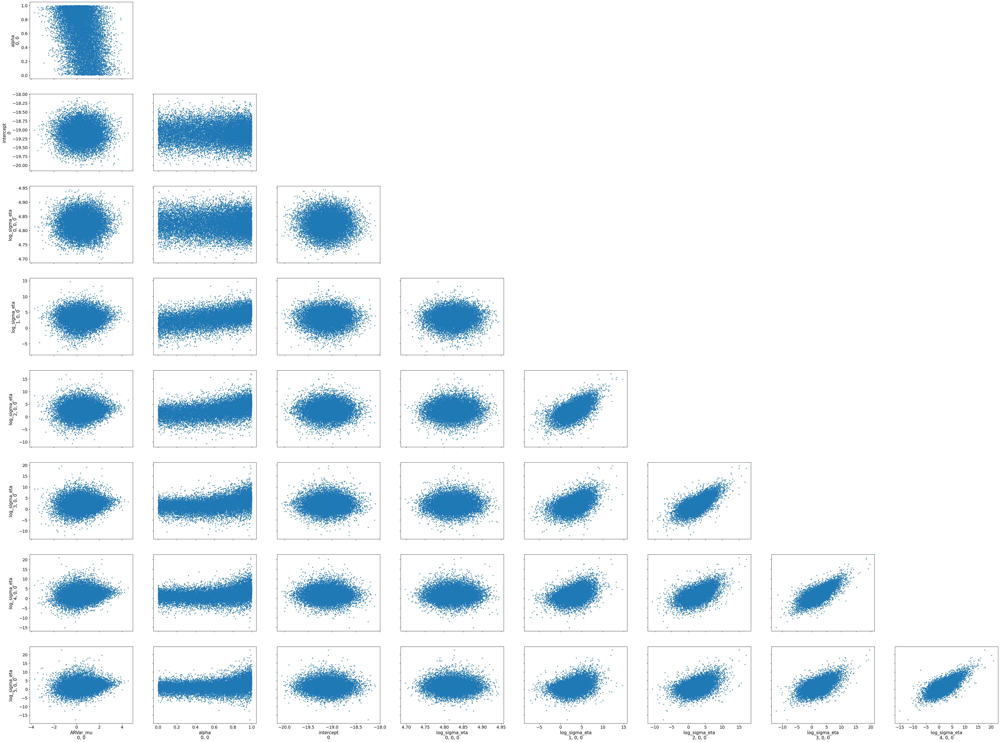

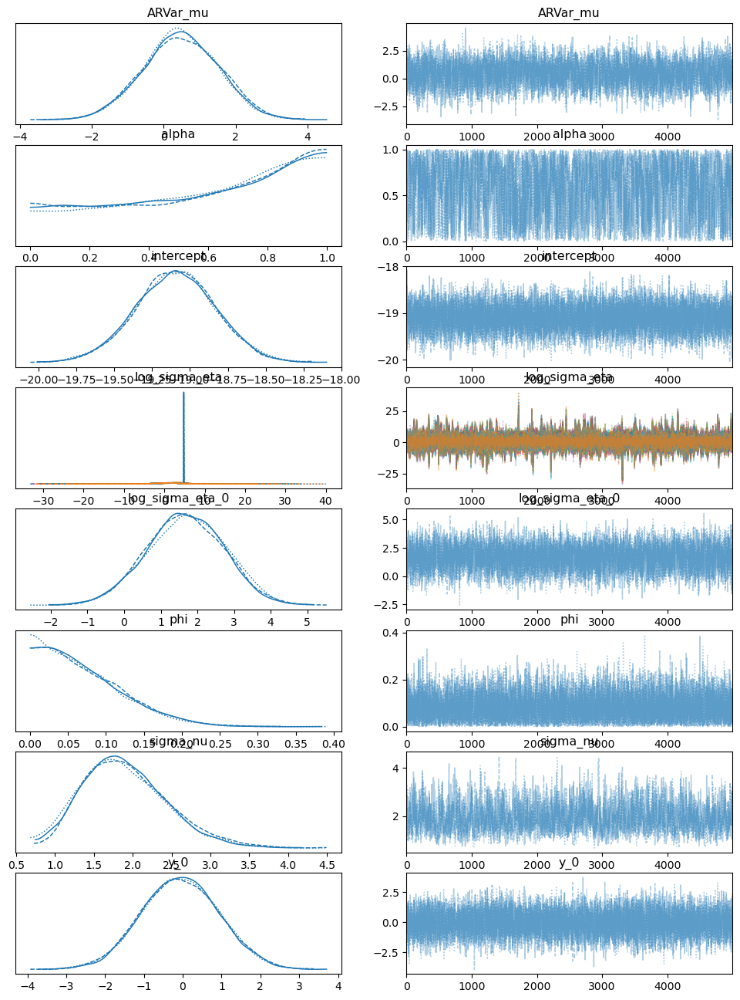

In [8]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=1, q=1, sigma_time = 'AR')

/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:03<00:00, 2968.26it/s, 63 steps of size 1.73e-01. acc. prob=0.85]



MCMC elapsed time: 66.66391968727112

                           mean       std    median      5.0%     95.0%     n_eff     r_hat
        ARVar_mu[0,0]      0.55      1.13      0.52     -1.03      2.62    170.22      1.02
           alpha[0,0]      0.58      0.30      0.62      0.10      0.98    233.89      1.02
         intercept[0]    344.67   1299.84    -18.95    -20.24    800.47     10.13      1.11
 log_sigma_eta[0,0,0]      4.84      0.04      4.83      4.77      4.89      6.19      1.14
 log_sigma_eta[1,0,0]      3.17      2.25      3.19     -0.51      6.82   1648.22      1.00
 log_sigma_eta[2,0,0]      2.51      2.61      2.36     -1.71      6.80   2105.38      1.00
 log_sigma_eta[3,0,0]      2.18      2.84      2.18     -2.50      6.62   1580.39      1.00
 log_sigma_eta[4,0,0]      1.80      2.93      1.60     -2.97      6.62   1829.80      1.00
 log_sigma_eta[5,0,0]      1.70      3.04      1.63     -3.23      6.58   1961.01      1.00
 log_sigma_eta[6,0,0]      1.52      3.09

/Users/dk29776/miniconda3/envs/forecastskill/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


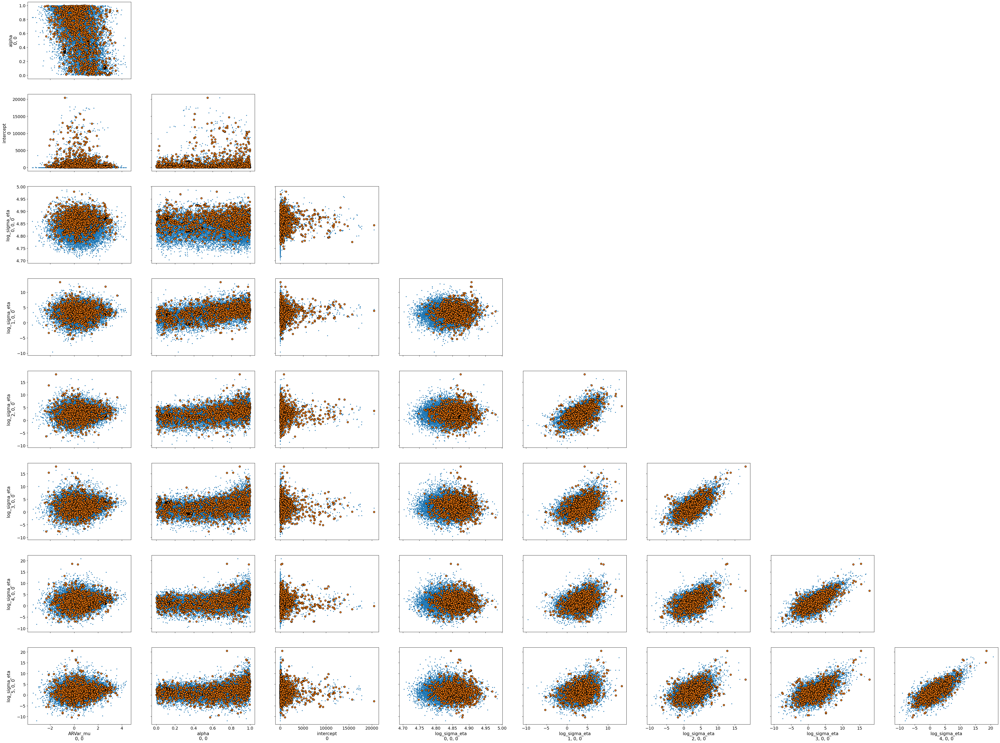

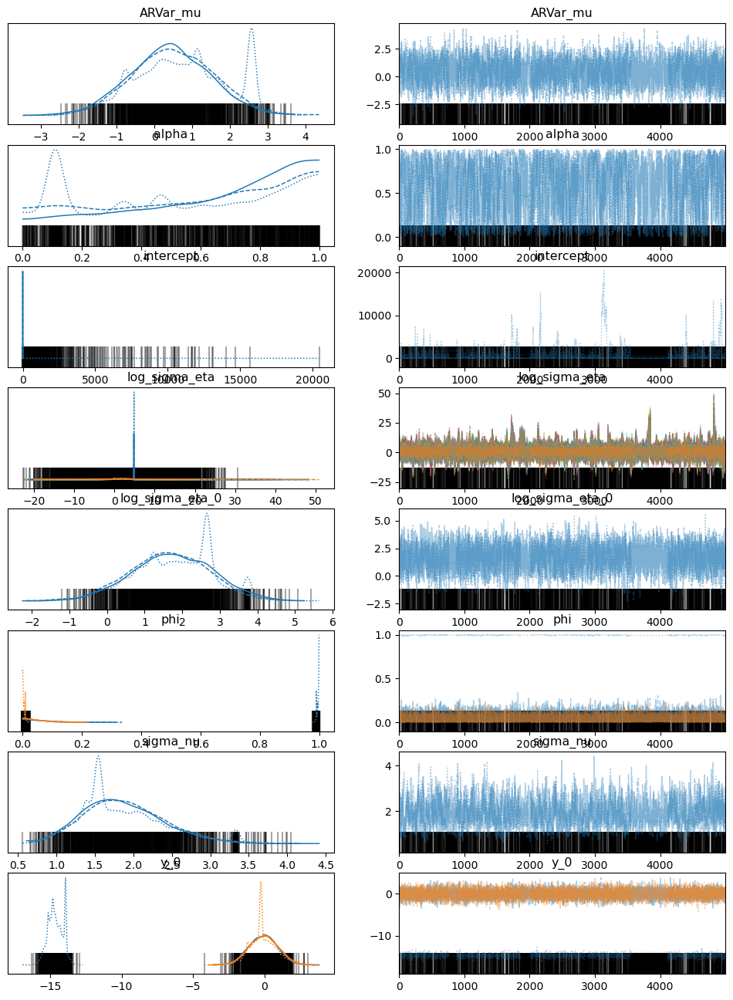

In [9]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=2, q=1, sigma_time = 'AR')

/var/folders/57/pf1ss2_n1sn5cdzq_nk8v7sm0000gr/T/ipykernel_46840/1531194592.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  mydf = jnp.array(df_pivot.groupby(level=0, axis=1).agg(lambda x: [*x.values]).to_numpy().tolist())
/Users/dk29776/Dropbox/epi/Comparing-Forecast-Performance/DFA/arhdfa_l1h1_me.py:325: UserWarning: There are not enough devices to run parallel chains: expected 3 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(3)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  self.mcmc = numpyro.infer.MCMC(


[nan nan nan nan]


sample: 100%|██████████| 10000/10000 [00:03<00:00, 3008.33it/s, 31 steps of size 1.70e-01. acc. prob=0.85]



MCMC elapsed time: 13.137241125106812

                           mean       std    median      5.0%     95.0%     n_eff     r_hat
        ARVar_mu[0,0]      0.45      1.07      0.44     -1.34      2.20   3401.06      1.00
           alpha[0,0]      0.60      0.29      0.66      0.15      1.00   1012.70      1.00
         intercept[0]    -19.06      0.27    -19.06    -19.51    -18.61  12884.96      1.00
 log_sigma_eta[0,0,0]      4.82      0.03      4.82      4.77      4.88  11828.80      1.00
 log_sigma_eta[1,0,0]      3.20      2.33      3.31     -0.87      6.76   3062.60      1.00
 log_sigma_eta[2,0,0]      2.54      2.72      2.51     -2.03      6.80   3194.92      1.00
 log_sigma_eta[3,0,0]      2.11      2.92      2.05     -2.38      7.14   3130.80      1.00
 log_sigma_eta[4,0,0]      1.87      3.06      1.78     -3.18      6.75   3177.92      1.00
 log_sigma_eta[5,0,0]      1.70      3.18      1.56     -3.30      6.95   3208.25      1.00
 log_sigma_eta[6,0,0]      1.57      3.2

/Users/dk29776/miniconda3/envs/forecastskill/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


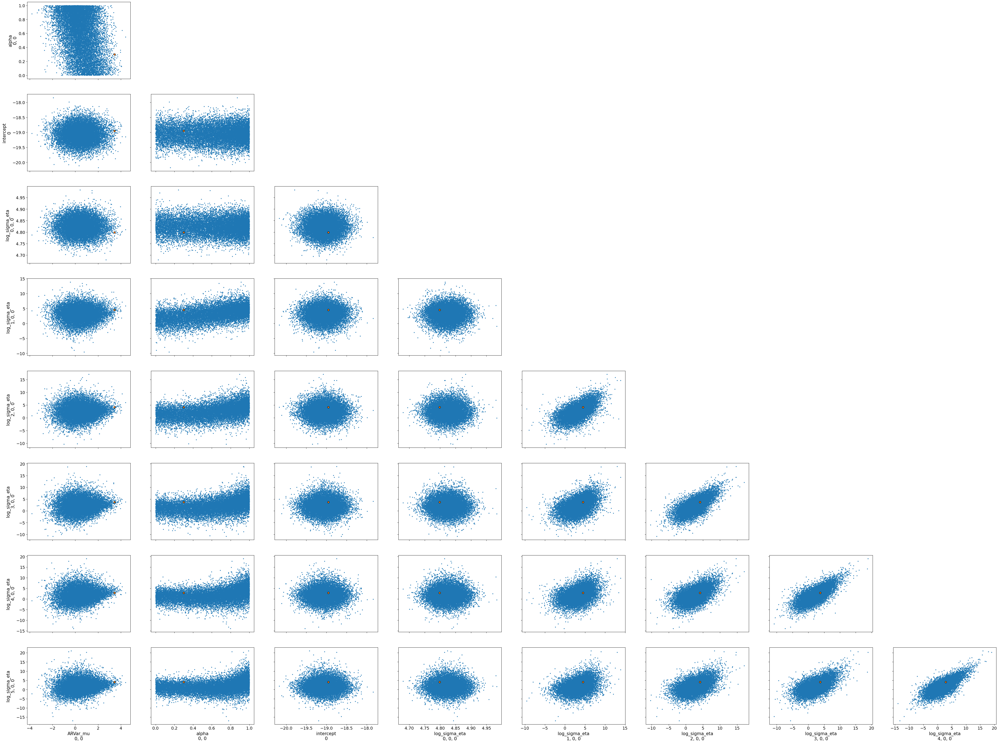

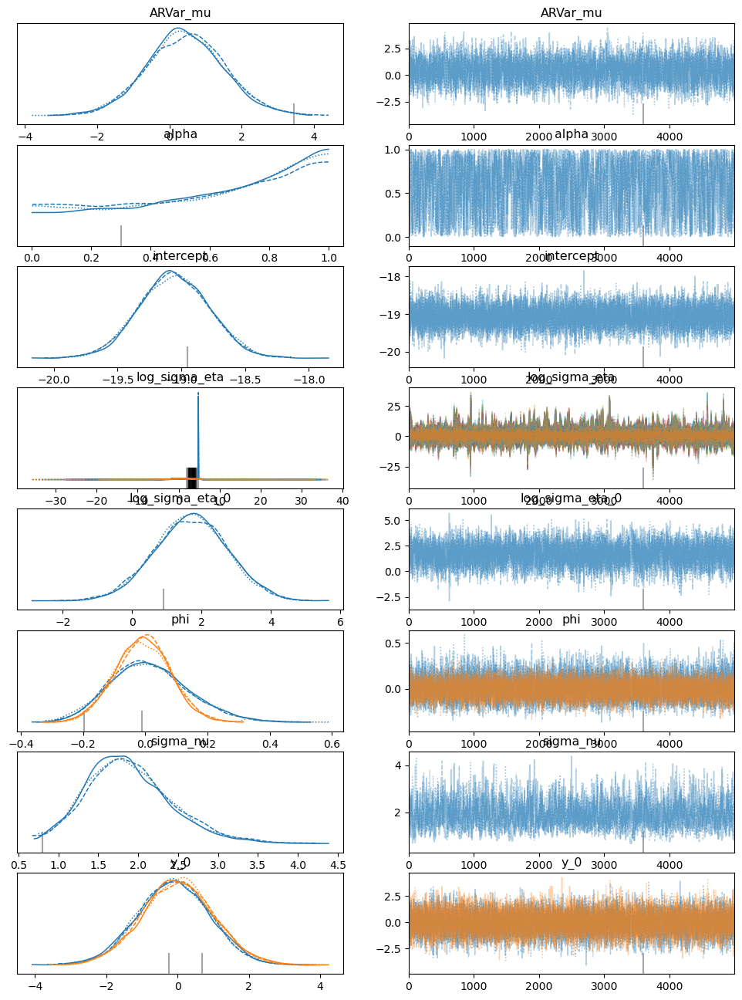

In [10]:
dfa_ftn('COVIDhub-4_week_ensemble', 'COVIDhub-baseline', 'diff', 'both', p=2, q=1, sigma_time = 'AR', ar_constraint = '[-1,1]')